In [19]:
!conda install -y pandas matplotlib tqdm

Solving environment: done

# All requested packages already installed.



In [1]:
import pandas as pd
import csv
import os,sys,json
from datetime import datetime
import matplotlib
import matplotlib.pylab as plt
import re
import tqdm
%matplotlib inline
font = {'family' : 'Noto Sans CJK JP'}
matplotlib.rc('font', **font)

In [2]:
%%html

<style>
    .jp-OutputArea-child {
        display: inline-block;
    }
</style>

In [3]:
def parse_matched(line):
    matched = re.match("^(..) (...) (...) (.*)", line)
    if not matched:
        return None
    country = matched[4].split(",")
    return [matched[1], matched[2], matched[3], country[0]]

def get_country3(code):
    return codes3[code] if code in codes3 else code

def get_country2(code):
    return codes2[code] if code in codes2 else code

with open("data/iso3166.txt","r") as f:
    code_list = [parse_matched(line) for line in f]
    codes3 = dict([(c[1], c[3]) for c in code_list if not c is None])
    codes2 = dict([(c[0], c[3]) for c in code_list if not c is None])
pd.DataFrame([c for c in code_list if not c is None], columns = ("alpha-2", "alpha-3", "code", "name"))

,alpha-2,alpha-3,code,name
0,AF,AFG,004,Afghanistan
1,AL,ALB,008,Albania
2,DZ,DZA,012,Algeria
3,AS,ASM,016,American Samoa
4,AD,AND,020,Andorra
...,...,...,...,...
273,YD,YMD,720,Yemen
274,YE,YEM,886,Yemen
275,YU,YUG,890,Yugoslavia
276,YU,YUG,891,Yugoslavia


In [4]:
situations=[
    "retail_and_recreation_percent_change_from_baseline",
    "grocery_and_pharmacy_percent_change_from_baseline",
    "parks_percent_change_from_baseline",
    "transit_stations_percent_change_from_baseline",
    "workplaces_percent_change_from_baseline",
    "residential_percent_change_from_baseline"
]

statistics=[
    "new_cases",
    "new_deaths"
]

In [5]:
mobility = pd.read_csv("data/Global_Mobility_Report.csv")
mobility = mobility.loc[mobility["sub_region_1"].isnull()].loc[mobility["sub_region_2"].isnull()].loc[mobility["metro_area"].isnull()]
trends = pd.read_csv("data/owid-covid-data.csv")

/home/seagetch/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (4,5) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [6]:
mobility["country_region_code"] = mobility["country_region_code"].apply(get_country2)
trends["iso_code"] = trends["iso_code"].apply(get_country3)
display(mobility)
display(trends)

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,United Arab Emirates,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,ChIJvRKrsd9IXj4RpwoIwFYv0zM,2020-02-15,0.0,4.0,5.0,0.0,2.0,1.0
1,United Arab Emirates,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,ChIJvRKrsd9IXj4RpwoIwFYv0zM,2020-02-16,1.0,4.0,4.0,1.0,2.0,1.0
2,United Arab Emirates,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,ChIJvRKrsd9IXj4RpwoIwFYv0zM,2020-02-17,-1.0,1.0,5.0,1.0,2.0,1.0
3,United Arab Emirates,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,ChIJvRKrsd9IXj4RpwoIwFYv0zM,2020-02-18,-2.0,1.0,5.0,0.0,2.0,1.0
4,United Arab Emirates,United Arab Emirates,NaN,NaN,NaN,NaN,NaN,ChIJvRKrsd9IXj4RpwoIwFYv0zM,2020-02-19,-2.0,0.0,4.0,-1.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5031962,Zimbabwe,Zimbabwe,NaN,NaN,NaN,NaN,NaN,ChIJYXGxBuekMRkR7r_LxV84wKE,2021-04-12,12.0,32.0,27.0,20.0,10.0,1.0
5031963,Zimbabwe,Zimbabwe,NaN,NaN,NaN,NaN,NaN,ChIJYXGxBuekMRkR7r_LxV84wKE,2021-04-13,13.0,36.0,21.0,15.0,8.0,1.0
5031964,Zimbabwe,Zimbabwe,NaN,NaN,NaN,NaN,NaN,ChIJYXGxBuekMRkR7r_LxV84wKE,2021-04-14,13.0,37.0,19.0,18.0,7.0,1.0
5031965,Zimbabwe,Zimbabwe,NaN,NaN,NaN,NaN,NaN,ChIJYXGxBuekMRkR7r_LxV84wKE,2021-04-15,17.0,38.0,16.0,20.0,8.0,1.0


,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,Afghanistan,Asia,Afghanistan,2020-02-24,1.0,1.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
1,Afghanistan,Asia,Afghanistan,2020-02-25,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
2,Afghanistan,Asia,Afghanistan,2020-02-26,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
3,Afghanistan,Asia,Afghanistan,2020-02-27,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
4,Afghanistan,Asia,Afghanistan,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82832,Zimbabwe,Africa,Zimbabwe,2021-04-15,37422.0,53.0,52.857,1550.0,2.0,2.571,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
82833,Zimbabwe,Africa,Zimbabwe,2021-04-16,37534.0,112.0,55.286,1551.0,1.0,2.286,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
82834,Zimbabwe,Africa,Zimbabwe,2021-04-17,37699.0,165.0,60.857,1552.0,1.0,2.000,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
82835,Zimbabwe,Africa,Zimbabwe,2021-04-18,37751.0,52.0,66.143,1553.0,1.0,2.143,...,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571


In [7]:
stats = pd.merge(trends, mobility, left_on=["iso_code","date"], right_on=["country_region_code", "date"])
stats

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,metro_area,iso_3166_2_code,census_fips_code,place_id,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,Afghanistan,Asia,Afghanistan,2020-02-24,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,ChIJbQL_-LZu0TgReNqWvg1GtfM,3.0,13.0,4.0,9.0,7.0,0.0
1,Afghanistan,Asia,Afghanistan,2020-02-25,1.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,ChIJbQL_-LZu0TgReNqWvg1GtfM,2.0,5.0,1.0,9.0,7.0,0.0
2,Afghanistan,Asia,Afghanistan,2020-02-26,1.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,ChIJbQL_-LZu0TgReNqWvg1GtfM,-1.0,5.0,2.0,3.0,5.0,1.0
3,Afghanistan,Asia,Afghanistan,2020-02-27,1.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,ChIJbQL_-LZu0TgReNqWvg1GtfM,-1.0,0.0,1.0,3.0,7.0,2.0
4,Afghanistan,Asia,Afghanistan,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,ChIJbQL_-LZu0TgReNqWvg1GtfM,-2.0,5.0,1.0,4.0,5.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51790,Zimbabwe,Africa,Zimbabwe,2021-04-12,37307.0,19.0,53.286,1542.0,4.0,2.429,...,NaN,NaN,NaN,ChIJYXGxBuekMRkR7r_LxV84wKE,12.0,32.0,27.0,20.0,10.0,1.0
51791,Zimbabwe,Africa,Zimbabwe,2021-04-13,37330.0,23.0,52.000,1543.0,1.0,1.714,...,NaN,NaN,NaN,ChIJYXGxBuekMRkR7r_LxV84wKE,13.0,36.0,21.0,15.0,8.0,1.0
51792,Zimbabwe,Africa,Zimbabwe,2021-04-14,37369.0,39.0,55.000,1548.0,5.0,2.429,...,NaN,NaN,NaN,ChIJYXGxBuekMRkR7r_LxV84wKE,13.0,37.0,19.0,18.0,7.0,1.0
51793,Zimbabwe,Africa,Zimbabwe,2021-04-15,37422.0,53.0,52.857,1550.0,2.0,2.571,...,NaN,NaN,NaN,ChIJYXGxBuekMRkR7r_LxV84wKE,17.0,38.0,16.0,20.0,8.0,1.0


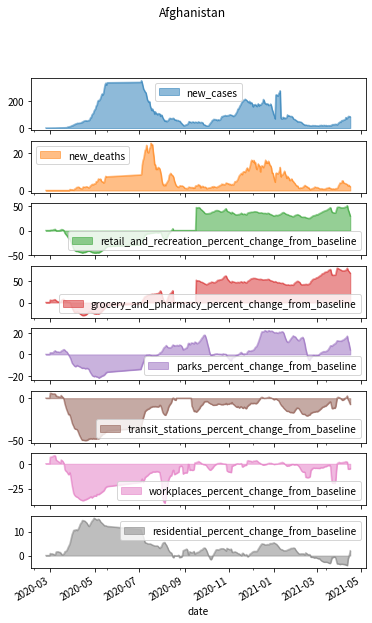

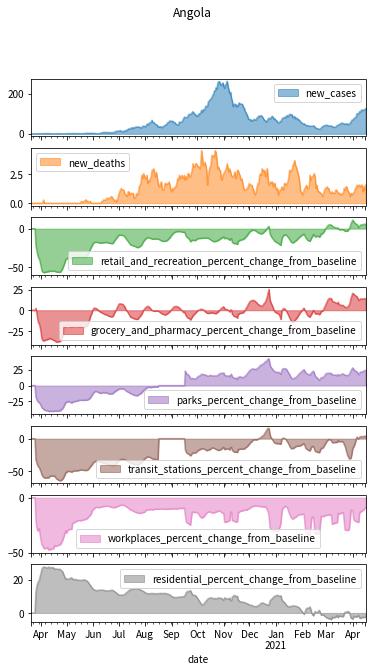

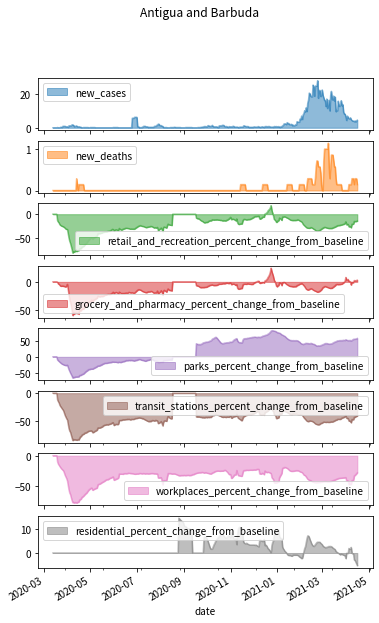

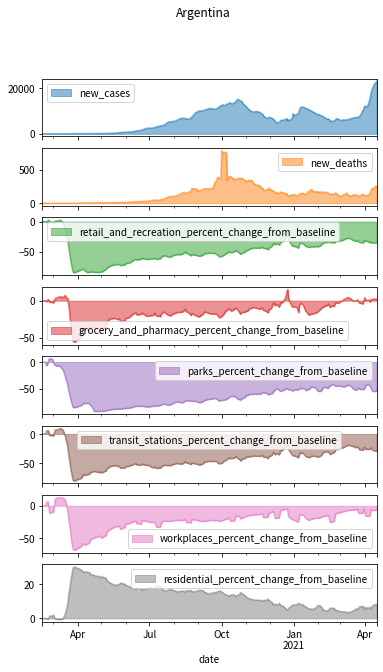

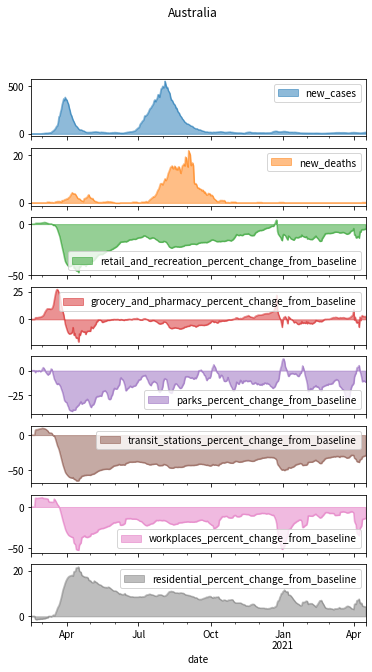

...

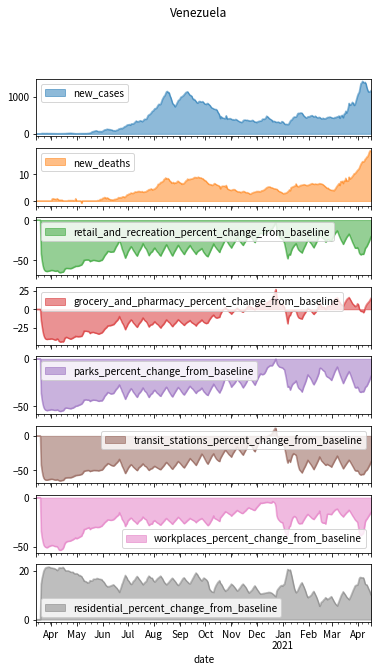

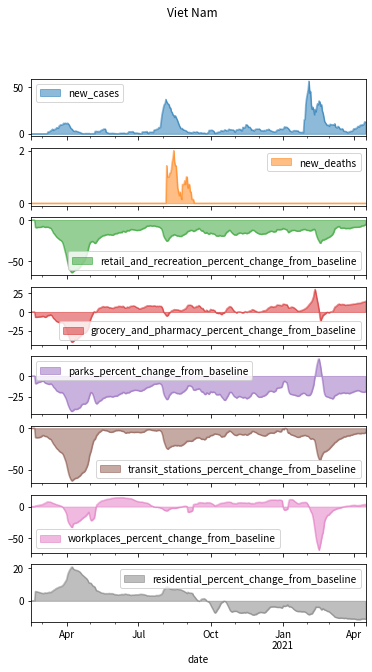

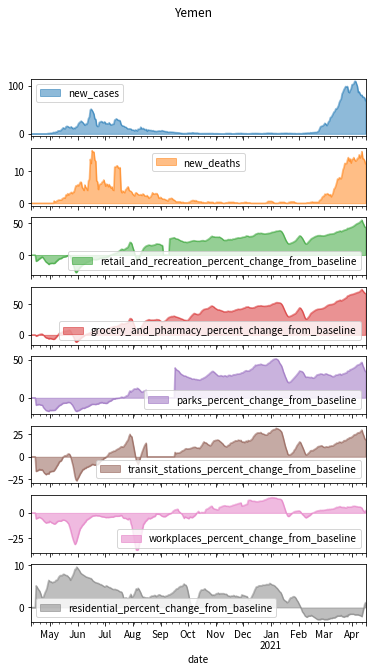

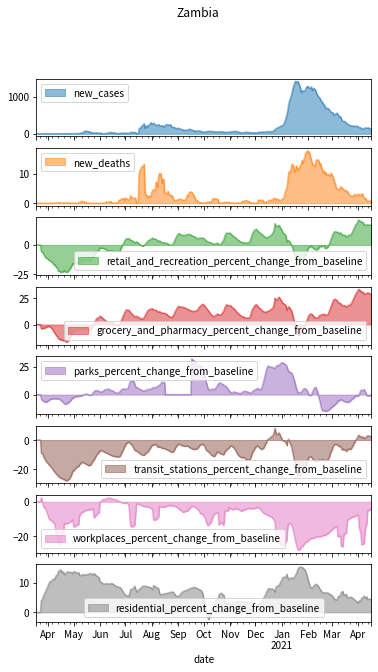

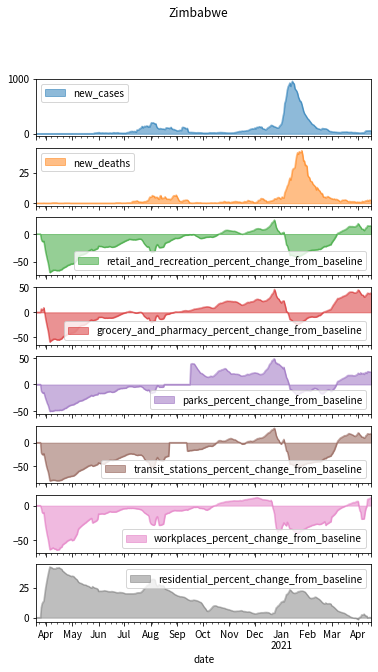

In [18]:
!mkdir -p stats-and-mobility
for country, df in stats.set_index("date")[["iso_code", "new_cases", "new_deaths"] + situations].groupby("iso_code"):
    ax=df.rolling(7).mean().plot(kind="area",stacked=False, title=country, subplots=True, layout=(8,1), sharex=True, figsize=(6,10))
#    ax.legend([c.replace("_percent_change_from_baseline","") for c in df.columns])
    plt.show()
    plt.savefig("stats-and-mobility/%s.png"%country, facecolor="white")
    plt.close()

In [9]:
targets = stats
targets["date"] = pd.to_datetime(targets["date"])
stats_diff = {}
for code, t in targets.groupby("iso_code"):
    t["new_cases"] = t["new_cases"].cumsum()
    t["new_deaths"] = t["new_deaths"].cumsum()
    diffs = t.groupby([t["date"].dt.year, t["date"].dt.month]).mean().diff().fillna(0)
    stats_diff[code] = diffs[statistics + situations]

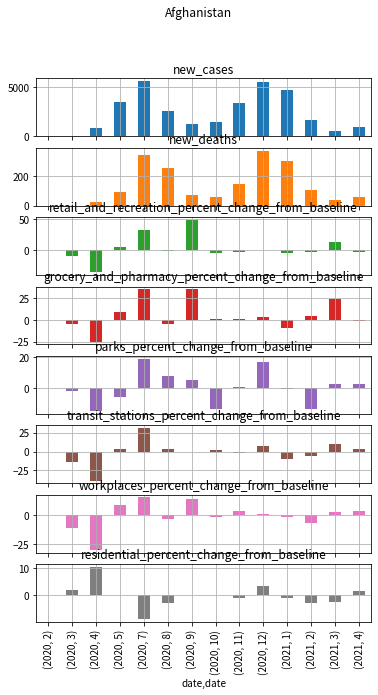

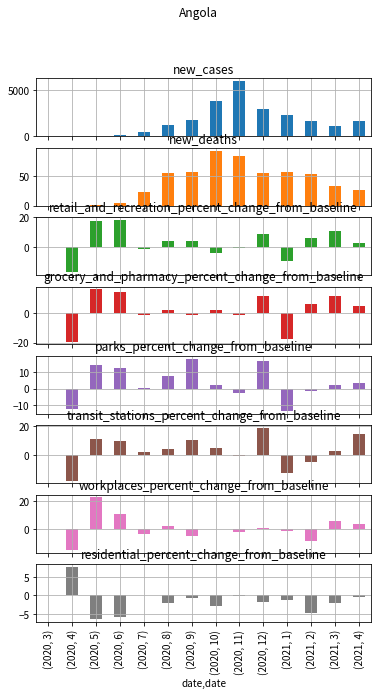

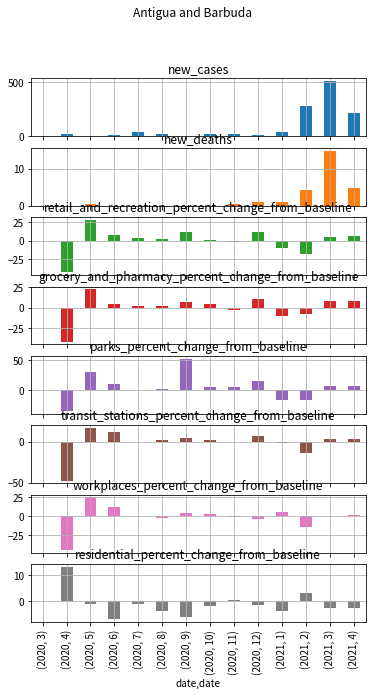

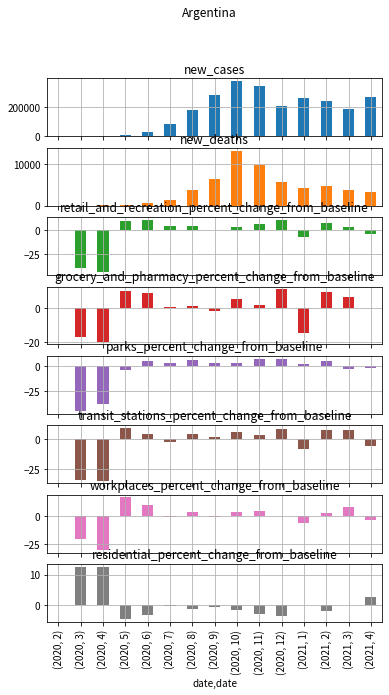

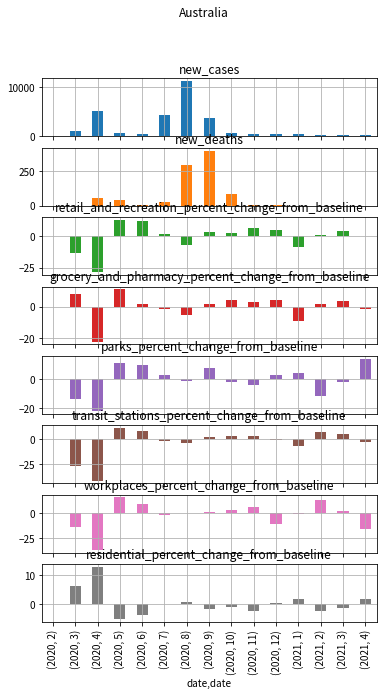

...

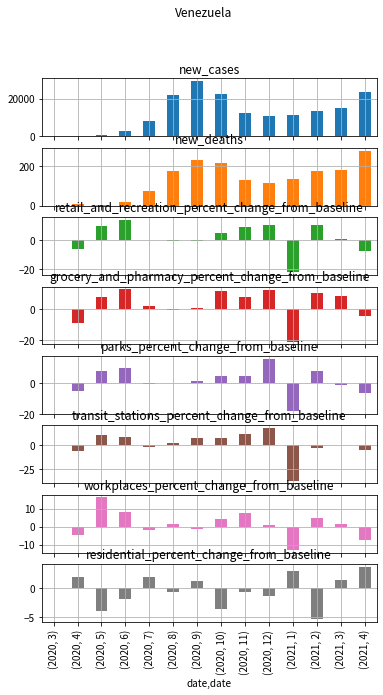

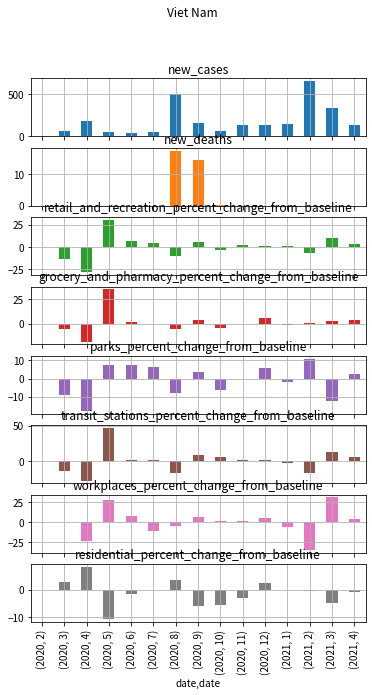

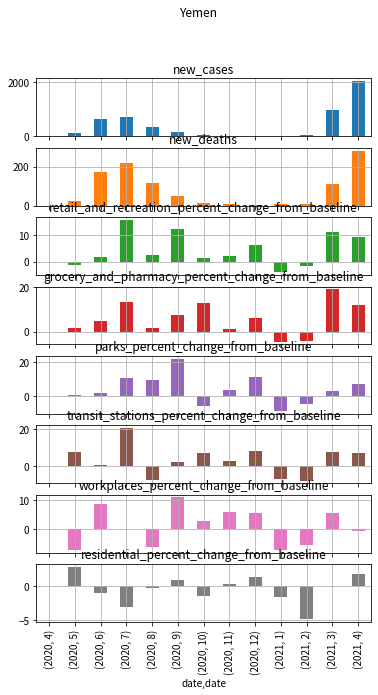

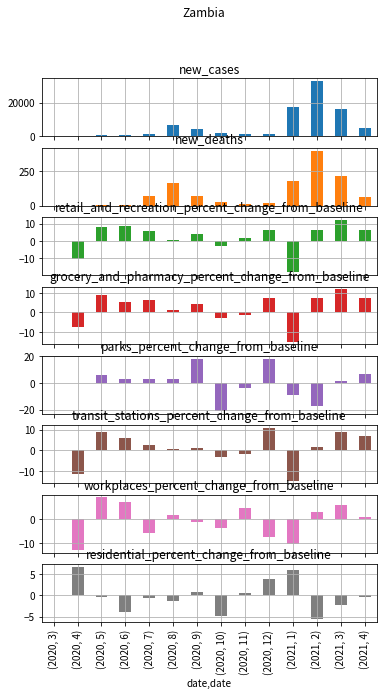

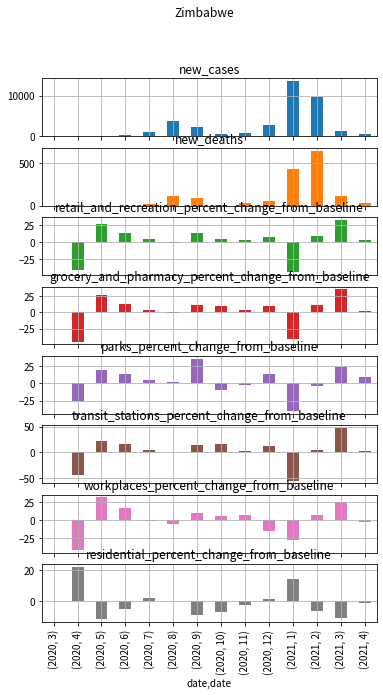

In [11]:
!mkdir -p stats-and-mobility/diffs
for country, df in stats_diff.items():
    fig,ax = plt.subplots(8, 1, figsize=(6,10))
    ax = ax.reshape(-1)
    df.plot(ax=ax, kind="bar", stacked=False, title=country, subplots=True, figsize=(6, 10), layout=(8,1), grid=True, sharex=True, legend = False)
    plt.savefig("stats-and-mobility/diffs/diff-%s.png"%country, facecolor="white")
    display(fig)
    plt.close(fig)